# First: libs and load

Imports

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns


Load the data

In [2]:
train_data = pd.read_csv('Train_data.csv')
test_data = pd.read_csv('test_data.csv')

# Second: Preprocessing

 Initialize Encoder and Scaler

In [3]:

encoder = LabelEncoder()
scaler = StandardScaler()


Combine 'Disease' Columns to Fit Encoder

In [4]:

all_disease_data = pd.concat([train_data['Disease'], test_data['Disease']])
encoder.fit(all_disease_data)


LabelEncoder()

Apply Encoding to Training Data

In [5]:

train_data['Disease'] = encoder.transform(train_data['Disease'])


Apply Encoding to Test Data and Handle Unseen Labels

In [6]:

test_data['Disease'] = test_data['Disease'].apply(lambda x: -1 if x not in encoder.classes_ else encoder.transform([x])[0])


 Scale Training Data

In [7]:
numeric_cols = train_data.columns.drop('Disease')
train_data[numeric_cols] = scaler.fit_transform(train_data[numeric_cols])


Scale Test Data

In [8]:

test_data[numeric_cols] = scaler.transform(test_data[numeric_cols])


In [9]:

encoder = LabelEncoder()
scaler = StandardScaler()


all_disease_data = pd.concat([train_data['Disease'], test_data['Disease']])
encoder.fit(all_disease_data)


train_data['Disease'] = encoder.transform(train_data['Disease'])

test_data['Disease'] = test_data['Disease'].apply(lambda x: -1 if x not in encoder.classes_ else encoder.transform([x])[0])


numeric_cols = train_data.columns.drop('Disease')


train_data[numeric_cols] = scaler.fit_transform(train_data[numeric_cols])
test_data[numeric_cols] = scaler.transform(test_data[numeric_cols])


Train-Validation Split

In [10]:

X_train, X_val, y_train, y_val = train_test_split(train_data[numeric_cols], train_data['Disease'], test_size=0.2, random_state=42)


# Third: Models

 Random Forest Model

In [11]:

rf_model = RandomForestClassifier(n_estimators=200, max_depth=10, min_samples_split=10, min_samples_leaf=4, random_state=42)


cv_scores_rf = cross_val_score(rf_model, X_train, y_train, cv=5)
print("Random Forest CV Average Score: ", np.mean(cv_scores_rf))


rf_model.fit(X_train, y_train)


y_pred_val_rf = rf_model.predict(X_val)
print("Random Forest Validation Accuracy:", accuracy_score(y_val, y_pred_val_rf))
print("Random Forest Validation Classification Report:\n", classification_report(y_val, y_pred_val_rf))


Random Forest CV Average Score:  1.0
Random Forest Validation Accuracy: 1.0
Random Forest Validation Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       134
           1       1.00      1.00      1.00       112
           2       1.00      1.00      1.00       102
           4       1.00      1.00      1.00       103
           5       1.00      1.00      1.00        20

    accuracy                           1.00       471
   macro avg       1.00      1.00      1.00       471
weighted avg       1.00      1.00      1.00       471



Evaluate Random Forest on Test Set

In [12]:

y_test_pred_rf = rf_model.predict(test_data[numeric_cols])

valid_indices = test_data['Disease'] != -1
print("Random Forest Test Accuracy:", accuracy_score(test_data['Disease'][valid_indices], y_test_pred_rf[valid_indices]))
print("Random Forest Test Classification Report:\n", classification_report(test_data['Disease'][valid_indices], y_test_pred_rf[valid_indices]))

Random Forest Test Accuracy: 0.44650205761316875
Random Forest Test Classification Report:
               precision    recall  f1-score   support

           0       0.36      0.46      0.41        84
           1       0.64      0.53      0.58       294
           2       0.05      0.80      0.10         5
           3       0.00      0.00      0.00        39
           4       0.27      0.33      0.30        48
           5       0.67      0.12      0.21        16

    accuracy                           0.45       486
   macro avg       0.33      0.38      0.27       486
weighted avg       0.50      0.45      0.46       486



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Bagging Classifier

In [13]:

bagging_model = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100, random_state=42)


cv_scores_bagging = cross_val_score(bagging_model, X_train, y_train, cv=5)
print("Bagging CV Average Score: ", np.mean(cv_scores_bagging))


bagging_model.fit(X_train, y_train)


y_pred_val_bagging = bagging_model.predict(X_val)
print("Bagging Validation Accuracy:", accuracy_score(y_val, y_pred_val_bagging))
print("Bagging Validation Classification Report:\n", classification_report(y_val, y_pred_val_bagging))


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Bagging CV Average Score:  1.0


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Bagging Validation Accuracy: 1.0
Bagging Validation Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       134
           1       1.00      1.00      1.00       112
           2       1.00      1.00      1.00       102
           4       1.00      1.00      1.00       103
           5       1.00      1.00      1.00        20

    accuracy                           1.00       471
   macro avg       1.00      1.00      1.00       471
weighted avg       1.00      1.00      1.00       471



Evaluate Bagging on Test Set

In [14]:

y_test_pred_bagging = bagging_model.predict(test_data[numeric_cols])
print("Bagging Test Accuracy:", accuracy_score(test_data['Disease'][valid_indices], y_test_pred_bagging[valid_indices]))
print("Bagging Test Classification Report:\n", classification_report(test_data['Disease'][valid_indices], y_test_pred_bagging[valid_indices]))


Bagging Test Accuracy: 0.3662551440329218
Bagging Test Classification Report:
               precision    recall  f1-score   support

           0       0.37      0.65      0.47        84
           1       0.64      0.31      0.41       294
           2       0.05      1.00      0.09         5
           3       0.00      0.00      0.00        39
           4       0.30      0.50      0.37        48
           5       0.33      0.25      0.29        16

    accuracy                           0.37       486
   macro avg       0.28      0.45      0.27       486
weighted avg       0.49      0.37      0.38       486



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Ensemble of Models

In [15]:

log_reg = LogisticRegression(max_iter=1000, random_state=42)
svm = SVC(kernel='linear', random_state=42, probability=True)
gbc = GradientBoostingClassifier(n_estimators=100, max_depth=3, random_state=42)


ensemble = VotingClassifier(estimators=[('rf', rf_model), ('log_reg', log_reg), ('svm', svm), ('gbc', gbc)], voting='soft')


cv_scores_ensemble = cross_val_score(ensemble, train_data[numeric_cols], train_data['Disease'], cv=5)
print("Ensemble CV Average Score: ", np.mean(cv_scores_ensemble))


ensemble.fit(train_data[numeric_cols], train_data['Disease'])


Ensemble CV Average Score:  1.0


VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(max_depth=10,
                                                     min_samples_leaf=4,
                                                     min_samples_split=10,
                                                     n_estimators=200,
                                                     random_state=42)),
                             ('log_reg',
                              LogisticRegression(max_iter=1000,
                                                 random_state=42)),
                             ('svm',
                              SVC(kernel='linear', probability=True,
                                  random_state=42)),
                             ('gbc',
                              GradientBoostingClassifier(random_state=42))],
                 voting='soft')

 Evaluate Ensemble on Test Set

In [16]:

y_test_pred_ensemble = ensemble.predict(test_data[numeric_cols])
print("Ensemble Test Accuracy:", accuracy_score(test_data['Disease'][valid_indices], y_test_pred_ensemble[valid_indices]))
print("Ensemble Test Classification Report:\n", classification_report(test_data['Disease'][valid_indices], y_test_pred_ensemble[valid_indices]))


Ensemble Test Accuracy: 0.37448559670781895
Ensemble Test Classification Report:
               precision    recall  f1-score   support

           0       0.33      0.50      0.40        84
           1       0.67      0.40      0.50       294
           2       0.04      0.80      0.08         5
           3       0.00      0.00      0.00        39
           4       0.22      0.29      0.25        48
           5       0.20      0.25      0.22        16

    accuracy                           0.37       486
   macro avg       0.24      0.37      0.24       486
weighted avg       0.49      0.37      0.41       486



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Recursive Feature Elimination (RFE) Setup

In [17]:

rfe = RFE(estimator=RandomForestClassifier(n_estimators=100, random_state=42), n_features_to_select=10, step=1)
rfe.fit(X_train, y_train)


RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=10)

Transform Data Using Selected Features

In [18]:

X_train_rfe = rfe.transform(X_train)
X_val_rfe = rfe.transform(X_val)
X_test_rfe = rfe.transform(test_data[numeric_cols])


Train Random Forest Model on Selected Features

In [19]:

rf_model_rfe = RandomForestClassifier(n_estimators=200, max_depth=10, min_samples_split=10, min_samples_leaf=4, random_state=42)
rf_model_rfe.fit(X_train_rfe, y_train)


RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=10,
                       n_estimators=200, random_state=42)

Validate the Model on the Validation Set

In [20]:

y_pred_val_rf_rfe = rf_model_rfe.predict(X_val_rfe)
print("RFE Random Forest Validation Accuracy:", accuracy_score(y_val, y_pred_val_rf_rfe))
print("RFE Random Forest Validation Classification Report:\n", classification_report(y_val, y_pred_val_rf_rfe))


RFE Random Forest Validation Accuracy: 1.0
RFE Random Forest Validation Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       134
           1       1.00      1.00      1.00       112
           2       1.00      1.00      1.00       102
           4       1.00      1.00      1.00       103
           5       1.00      1.00      1.00        20

    accuracy                           1.00       471
   macro avg       1.00      1.00      1.00       471
weighted avg       1.00      1.00      1.00       471



Evaluate the Model on the Test Set

In [21]:

y_test_pred_rf_rfe = rf_model_rfe.predict(X_test_rfe)
print("RFE Random Forest Test Accuracy:", accuracy_score(test_data['Disease'][valid_indices], y_test_pred_rf_rfe[valid_indices]))
print("RFE Random Forest Test Classification Report:\n", classification_report(test_data['Disease'][valid_indices], y_test_pred_rf_rfe[valid_indices]))


RFE Random Forest Test Accuracy: 0.36213991769547327
RFE Random Forest Test Classification Report:
               precision    recall  f1-score   support

           0       0.30      0.54      0.38        84
           1       0.54      0.34      0.42       294
           2       0.07      0.80      0.12         5
           3       0.00      0.00      0.00        39
           4       0.30      0.50      0.37        48
           5       0.29      0.12      0.17        16

    accuracy                           0.36       486
   macro avg       0.25      0.38      0.25       486
weighted avg       0.42      0.36      0.36       486



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Define Hyperparameter Grid

In [22]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

Initialize and Fit GridSearchCV

In [23]:

rf = RandomForestClassifier(random_state=42)


grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)


grid_search.fit(X_train, y_train)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             verbose=2)

 Retrieve Best Parameters and Estimator

In [24]:
best_params = grid_search.best_params_
best_rf = grid_search.best_estimator_

print("Best parameters found: ", best_params)


Best parameters found:  {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}


Validate the Best Model on the Validation Set

In [25]:
y_pred_val_best_rf = best_rf.predict(X_val)
print("Best RF Validation Accuracy:", accuracy_score(y_val, y_pred_val_best_rf))
print("Best RF Validation Classification Report:\n", classification_report(y_val, y_pred_val_best_rf))

Best RF Validation Accuracy: 1.0
Best RF Validation Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       134
           1       1.00      1.00      1.00       112
           2       1.00      1.00      1.00       102
           4       1.00      1.00      1.00       103
           5       1.00      1.00      1.00        20

    accuracy                           1.00       471
   macro avg       1.00      1.00      1.00       471
weighted avg       1.00      1.00      1.00       471



Evaluate the Best Model on the Test Set

In [26]:

y_test_pred_best_rf = best_rf.predict(test_data[numeric_cols])

valid_indices = test_data['Disease'] != -1
print("Best RF Test Accuracy:", accuracy_score(test_data['Disease'][valid_indices], y_test_pred_best_rf[valid_indices]))
print("Best RF Test Classification Report:\n", classification_report(test_data['Disease'][valid_indices], y_test_pred_best_rf[valid_indices]))


Best RF Test Accuracy: 0.4506172839506173
Best RF Test Classification Report:
               precision    recall  f1-score   support

           0       0.36      0.46      0.41        84
           1       0.62      0.54      0.58       294
           2       0.05      0.80      0.10         5
           3       0.00      0.00      0.00        39
           4       0.31      0.31      0.31        48
           5       1.00      0.12      0.22        16

    accuracy                           0.45       486
   macro avg       0.39      0.37      0.27       486
weighted avg       0.50      0.45      0.46       486



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Apply SMOTE to Balance the Training Data

In [27]:

smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)


Retrain the Best Random Forest Model on the Resampled Data

In [28]:

best_rf.fit(X_train_res, y_train_res)


RandomForestClassifier(n_estimators=50, random_state=42)

Validate the Resampled Random Forest Model on the Validation Set

In [29]:

y_pred_val_resampled_rf = best_rf.predict(X_val)
print("Resampled RF Validation Accuracy:", accuracy_score(y_val, y_pred_val_resampled_rf))
print("Resampled RF Validation Classification Report:\n", classification_report(y_val, y_pred_val_resampled_rf))


Resampled RF Validation Accuracy: 1.0
Resampled RF Validation Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       134
           1       1.00      1.00      1.00       112
           2       1.00      1.00      1.00       102
           4       1.00      1.00      1.00       103
           5       1.00      1.00      1.00        20

    accuracy                           1.00       471
   macro avg       1.00      1.00      1.00       471
weighted avg       1.00      1.00      1.00       471



Evaluate the Resampled Random Forest Model on the Test Set

In [30]:

y_test_pred_resampled_rf = best_rf.predict(test_data[numeric_cols])


valid_indices = test_data['Disease'] != -1

print("Resampled RF Test Accuracy:", accuracy_score(test_data['Disease'][valid_indices], y_test_pred_resampled_rf[valid_indices]))
print("Resampled RF Test Classification Report:\n", classification_report(test_data['Disease'][valid_indices], y_test_pred_resampled_rf[valid_indices]))


Resampled RF Test Accuracy: 0.37037037037037035
Resampled RF Test Classification Report:
               precision    recall  f1-score   support

           0       0.34      0.48      0.40        84
           1       0.63      0.39      0.48       294
           2       0.05      1.00      0.09         5
           3       0.00      0.00      0.00        39
           4       0.21      0.33      0.25        48
           5       0.60      0.19      0.29        16

    accuracy                           0.37       486
   macro avg       0.30      0.40      0.25       486
weighted avg       0.48      0.37      0.40       486



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Fourth:Data viualisation

In [31]:
sns.set(style="whitegrid")

no need for handling outliers

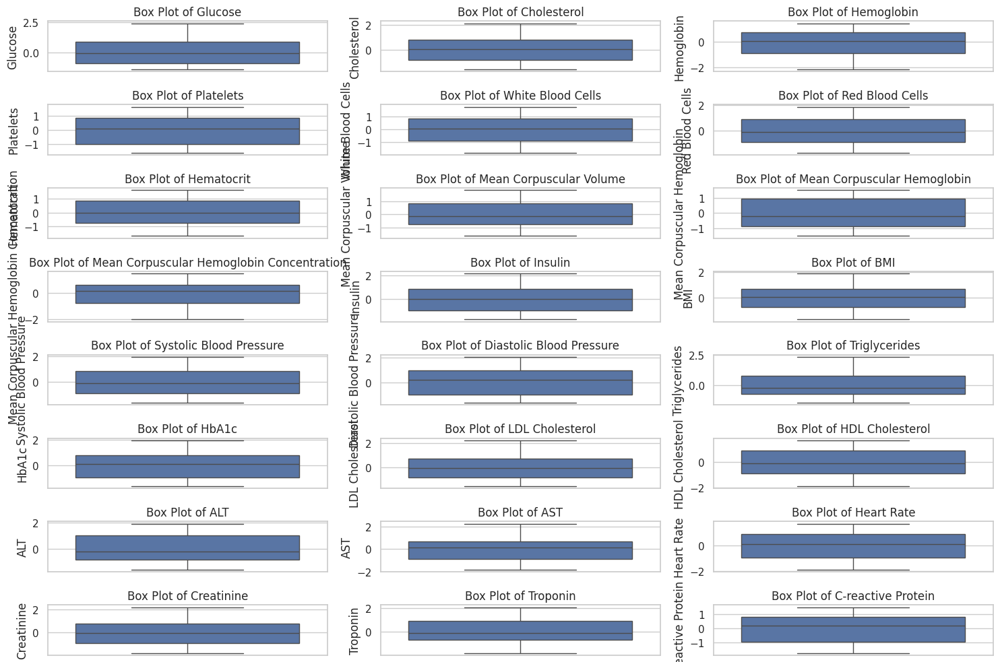

In [32]:

plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols):
    plt.subplot((len(numeric_cols) + 2) // 3, 3, i + 1)
    sns.boxplot(y=train_data[col])
    plt.title(f'Box Plot of {col}')
plt.tight_layout()
plt.show()


Data distribution

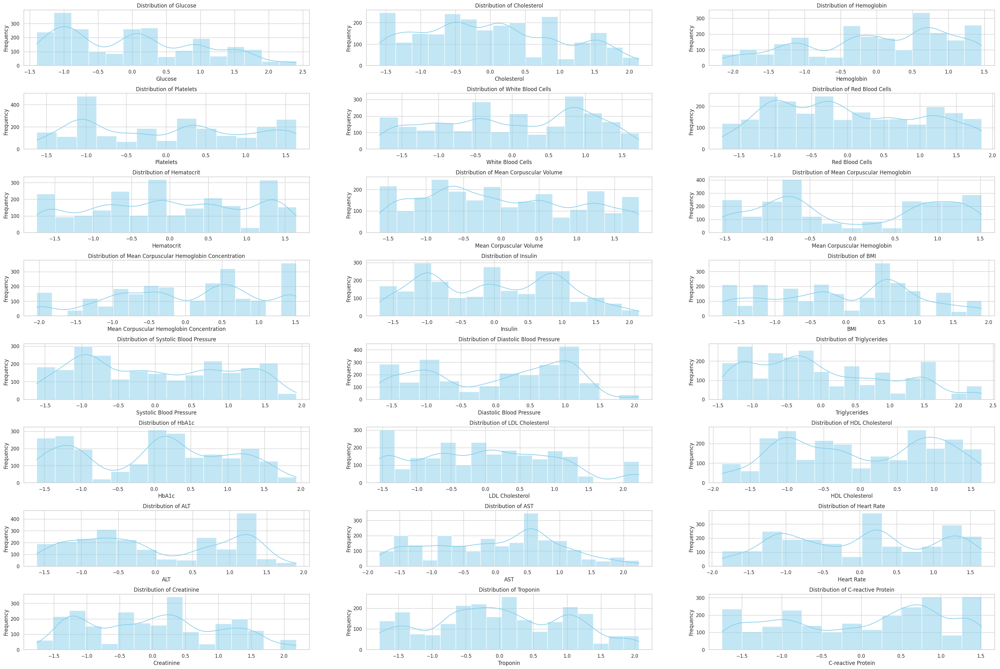

In [33]:

plt.figure(figsize=(40, 30))
plt.subplots_adjust(hspace=0.5)


for i, col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols) // 3 + 1, 3, i + 1)
    sns.histplot(train_data[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.show()

Correlation Heatmap

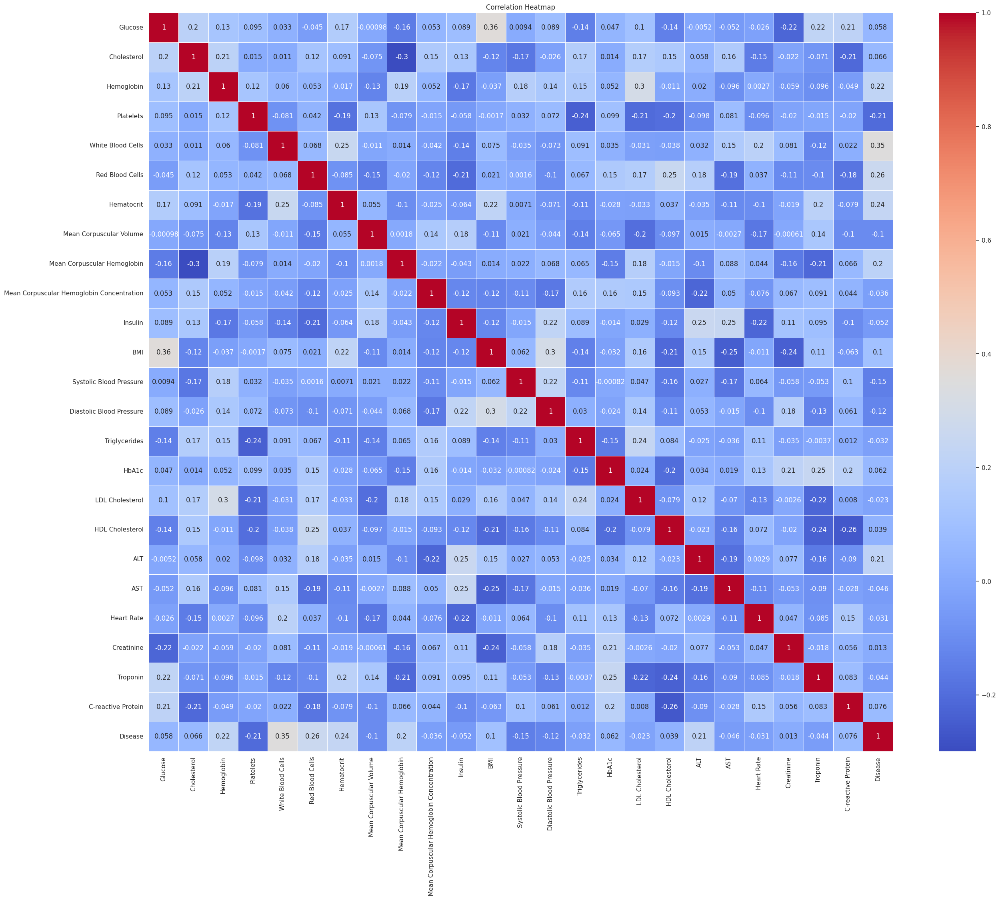

In [34]:

plt.figure(figsize=(30, 24))
correlation_matrix = train_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

Pair plot

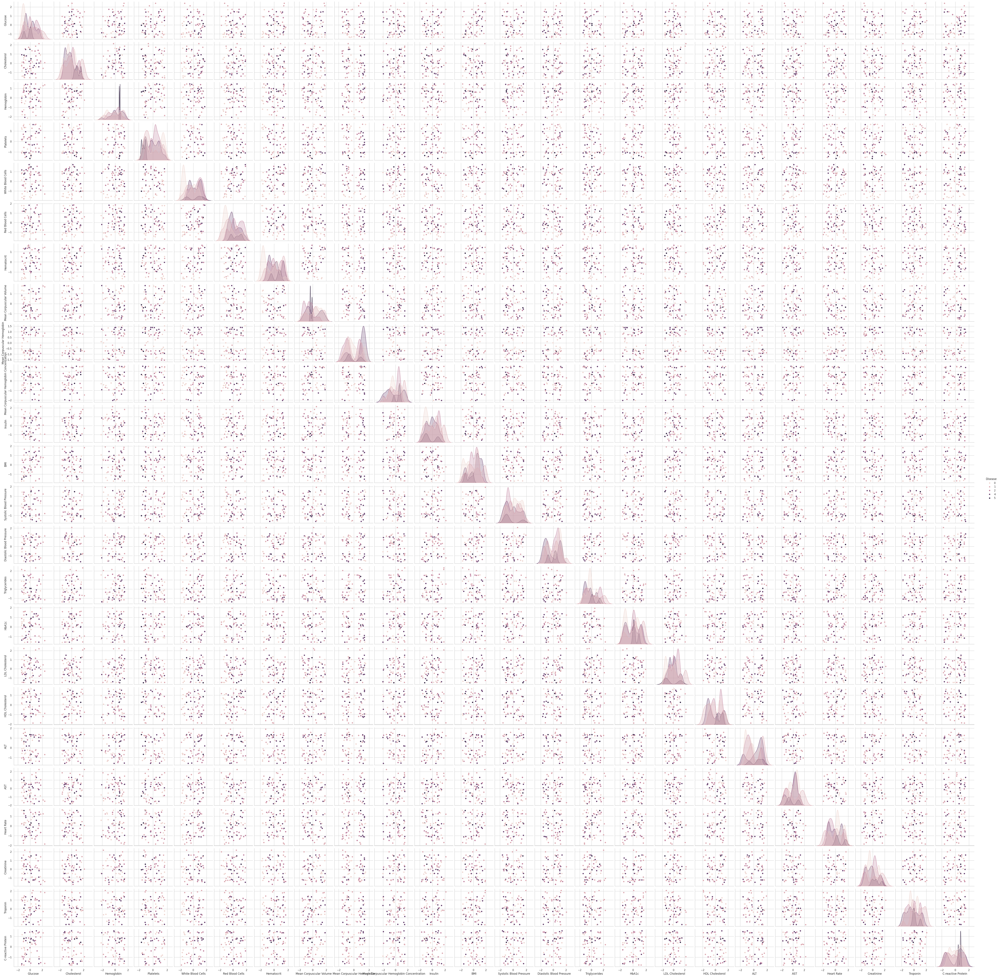

In [35]:

train_data_visual = pd.concat([pd.DataFrame(train_data[numeric_cols], columns=numeric_cols), train_data['Disease']], axis=1)


sns.pairplot(train_data_visual, hue='Disease', diag_kind='kde')
plt.show()
